## First, lets join our tables etc..

In [1]:
import pandas as pd
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)

In [2]:
complaints_df = pd.read_pickle('./complaints_v2.pkl')
reports_df = pd.read_pickle('./reports.pkl')

In [3]:
#add a url feature to match with reports_df
complaints_df['url'] = complaints_df.apply(lambda x: x.complaints['url'],axis=1)
complaints_df.head()

,complaint_id,complaint_type,address,street_number,street_number_to,direction,street_name,street_type,inspector,complaint_date,complaint_detail,inspection_log,data_source,modified_date,latitude,longitude,location,complaints,url
0,11420,TOXICS HAZARDOUS MATERIALS WORK ORDER,1319 S KILBOURN AVE,1319,NaN,S,KILBOURN,AVE,227404,2014-07-15T00:00:00.000,ABANDONED DRUM AT ABOVE LOCATION.,[INSPECTION LOG #: 11446 16-JUL-14 17:33:00] I...,DEPT. OF PUBLIC HEALTH,2014-07-16T00:00:00.000,41.863592,-87.737175,POINT (-87.73717532729161 41.863592021884074),{'url': 'https://data.cityofchicago.org/resour...,https://data.cityofchicago.org/resource/fypr-k...
0,DOECOMP9999,Air Pollution Work Order,2245 W BARRY AVE,2245,NaN,W,BARRY,AVE,24,1993-10-07T00:00:00.000,HAIR SPRAY ODOR COMING FROM RADIATORS SMELLS V...,MORE INFORMATION MAY BE AVAILABLE IN THE CDPH ...,HISTORIC DEPT. OF ENVIRONMENT,2012-01-01T00:00:00.000,41.937559,-87.685076,POINT (-87.6850758092331 41.93755931175152),{'url': 'https://data.cityofchicago.org/resour...,https://data.cityofchicago.org/resource/fypr-k...
0,DOECOMP15775,Air Pollution Work Order,3205 N CLARK ST,3205,NaN,N,CLARK,ST,35,1995-02-01T00:00:00.000,G M ZSOLNAY MANAGEMENT RESIDENTS ...,MORE INFORMATION MAY BE AVAILABLE IN THE CDPH ...,HISTORIC DEPT. OF ENVIRONMENT,2012-01-01T00:00:00.000,41.940204,-87.650712,POINT (-87.65071182685475 41.94020395354361),{'url': 'https://data.cityofchicago.org/resour...,https://data.cityofchicago.org/resource/fypr-k...
0,DOECOMP21273,Toxics Hazardous Materials Work Order,4300 N ALBANY AVE,4300,NaN,N,ALBANY,AVE,50,2001-01-01T00:00:00.000,GAS RELEASE FROM PIPE LINE. INSPECTOR FOUND GA...,MORE INFORMATION MAY BE AVAILABLE IN THE CDPH ...,HISTORIC DEPT. OF ENVIRONMENT,2012-01-01T00:00:00.000,41.959470,-87.705895,POINT (-87.70589480804409 41.95946962915748),{'url': 'https://data.cityofchicago.org/resour...,https://data.cityofchicago.org/resource/fypr-k...
0,DOECOMP27751,Air Pollution Work Order,6028 W CORNELIA AVE,6028,NaN,W,CORNELIA,AVE,16,1993-09-27T00:00:00.000,NaN,MORE INFORMATION MAY BE AVAILABLE IN THE CDPH ...,HISTORIC DEPT. OF ENVIRONMENT,2012-01-01T00:00:00.000,41.944038,-87.777611,POINT (-87.77761053809083 41.94403845118991),{'url': 'https://data.cityofchicago.org/resour...,https://data.cityofchicago.org/resource/fypr-k...


In [4]:
reports_df['url'] = reports_df.apply(lambda x: x.complaints['url'],axis=1)
reports_df.head()

,address,street_number,direction,street_name,street_type,complaints,inspections,latitude,longitude,location,permits,enforcement,tanks,neshaps_demolition_notices,holds,url
0,1 S FINANCIAL PL,1,S,FINANCIAL,PL,{'url': 'https://data.cityofchicago.org/resour...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://data.cityofchicago.org/resource/fypr-k...
1,10000 S COMMERCIAL AVE,10000,S,COMMERCIAL,AVE,{'url': 'https://data.cityofchicago.org/resour...,{'url': 'https://data.cityofchicago.org/resour...,41.71330927944233,-87.55109645009955,"{'type': 'Point', 'coordinates': [-87.55109645...",NaN,NaN,NaN,NaN,NaN,https://data.cityofchicago.org/resource/fypr-k...
2,10157 S WESTERN AVE,10157,S,WESTERN,AVE,{'url': 'https://data.cityofchicago.org/resour...,{'url': 'https://data.cityofchicago.org/resour...,41.70840185452616,-87.68153590856559,"{'type': 'Point', 'coordinates': [-87.68153590...",{'url': 'https://data.cityofchicago.org/resour...,NaN,NaN,NaN,NaN,https://data.cityofchicago.org/resource/fypr-k...
3,1059 N WOLCOTT AVE,1059,N,WOLCOTT,AVE,{'url': 'https://data.cityofchicago.org/resour...,{'url': 'https://data.cityofchicago.org/resour...,41.90132042594509,-87.67461659752595,"{'type': 'Point', 'coordinates': [-87.67461659...",NaN,NaN,NaN,NaN,NaN,https://data.cityofchicago.org/resource/fypr-k...
4,111 W 87TH ST,111,W,87TH,ST,{'url': 'https://data.cityofchicago.org/resour...,NaN,41.73615956889584,-87.62747171270124,"{'type': 'Point', 'coordinates': [-87.62747171...",NaN,NaN,NaN,NaN,NaN,https://data.cityofchicago.org/resource/fypr-k...


In [5]:
df = reports_df.merge(complaints_df, on='url')
df_temp = df.copy().fillna(0)

In [6]:
df_t = df_temp[['direction_x','street_type_x',
                'latitude_x','longitude_x','permits','tanks',
                'neshaps_demolition_notices','holds',
                'complaint_type','street_number_x','enforcement']]

In [7]:
# these are features where a Nan value indicates 0 and all other values indicate 1. 
# Making this adjustment now
dict_columns = ['enforcement','permits','tanks','neshaps_demolition_notices','holds']
for i in dict_columns:
    df_t[i] = df_t.apply(lambda x: 1 if x[i] != 0 else 0 ,axis=1)

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [8]:
# applying a 
categorical = ['direction_x','street_type_x','complaint_type']
le = preprocessing.LabelEncoder()
for c in categorical:
    df_t[c] = df_t[c].apply(str)
    #le = preprocessing.LabelEncoder()
    le.fit(df_t[c])
    df_t[c] = le.transform(df_t[c])

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [9]:
df_t

,direction_x,street_type_x,latitude_x,longitude_x,permits,tanks,neshaps_demolition_notices,holds,complaint_type,street_number_x,enforcement
0,2,1,41.71330927944233,-87.55109645009955,0,0,0,0,2,10000,0
1,2,1,41.71330927944233,-87.55109645009955,0,0,0,0,2,10000,0
2,2,1,41.71330927944233,-87.55109645009955,0,0,0,0,2,10000,0
3,2,1,41.71330927944233,-87.55109645009955,0,0,0,0,2,10000,0
4,2,1,41.71330927944233,-87.55109645009955,0,0,0,0,2,10000,0
...,...,...,...,...,...,...,...,...,...,...,...
83570,2,11,41.759140319710205,-87.65289476576204,0,0,0,0,9,7414,0
83571,2,1,41.74614699608132,-87.61008757367442,0,0,0,0,5,8146,0
83572,2,1,41.74614699608132,-87.61008757367442,0,0,0,0,9,8146,0
83573,3,1,41.931720173523466,-87.64599787902512,0,0,0,0,11,636,0


In [10]:
# converting object types to floats,ints
categories = {'latitude_x':float,'longitude_x':float,'street_number_x':int}
for c in categories:
    df_t[c] = df_t[c].apply(categories[c])

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [11]:
df_t.dtypes

direction_x                     int64
street_type_x                   int64
latitude_x                    float64
longitude_x                   float64
permits                         int64
tanks                           int64
neshaps_demolition_notices      int64
holds                           int64
complaint_type                  int64
street_number_x                 int64
enforcement                     int64
dtype: object

In [12]:
df_t_features = df_t.drop('enforcement',axis=1)
df_t_target = df_t[['enforcement']]

In [13]:
df_t_features

,direction_x,street_type_x,latitude_x,longitude_x,permits,tanks,neshaps_demolition_notices,holds,complaint_type,street_number_x
0,2,1,41.713309,-87.551096,0,0,0,0,2,10000
1,2,1,41.713309,-87.551096,0,0,0,0,2,10000
2,2,1,41.713309,-87.551096,0,0,0,0,2,10000
3,2,1,41.713309,-87.551096,0,0,0,0,2,10000
4,2,1,41.713309,-87.551096,0,0,0,0,2,10000
...,...,...,...,...,...,...,...,...,...,...
83570,2,11,41.759140,-87.652895,0,0,0,0,9,7414
83571,2,1,41.746147,-87.610088,0,0,0,0,5,8146
83572,2,1,41.746147,-87.610088,0,0,0,0,9,8146
83573,3,1,41.931720,-87.645998,0,0,0,0,11,636


In [14]:
X_train, X_test, y_train, y_test =  train_test_split(df_t_features,df_t_target, test_size=0.2)


### Testing a decision tree

In [15]:
dt = DecisionTreeClassifier(max_depth=12,random_state=0)
dt.fit(X_train, y_train)
predictions = dt.predict(X_test)
confusion_matrix(y_test,predictions)
#dt.score(X_test,y_test)

array([[10955,   703],
       [ 1810,  3247]])

### Testing a random forest

In [16]:
clf = RandomForestClassifier(max_depth=12, random_state=0)
clf.fit(X_train, y_train)
clf.score(X_test,y_test)

/usr/local/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


0.9006281782829794

In [17]:
d = dict(zip(clf.feature_importances_, df_t_features.columns))
for elem in sorted(d.items(),reverse=True) :
    print(f'{elem[1]}: {round(elem[0],6)} ')

permits: 0.203323 
longitude_x: 0.201038 
latitude_x: 0.181594 
street_number_x: 0.165965 
tanks: 0.086997 
complaint_type: 0.055215 
street_type_x: 0.046193 
neshaps_demolition_notices: 0.026594 
direction_x: 0.025277 
holds: 0.007803 


## Simple visualization

The logitude and Latitude carry significant importance regarding whether a complaint is enforced or not.  So lets visually try to understand if there are certain parts of the city where a complaint hsa higher "importance"

In [18]:
# I will plot every point using its coordinates and mark it red or blue based on if it was enforced or not


In [19]:
BBox = ((df_t.longitude_x.min(),   max(i for i in df_t.longitude_x if i < 0),      
         min(i for i in df_t.latitude_x if i > 0.0), df_t.latitude_x.max()))

In [20]:
BBox

(-87.91443584831512, -87.52467915139687, 41.64471104296954, 42.02266893033332)

In [21]:
ruh_m = plt.imread('./chicago.png')

In [22]:
#

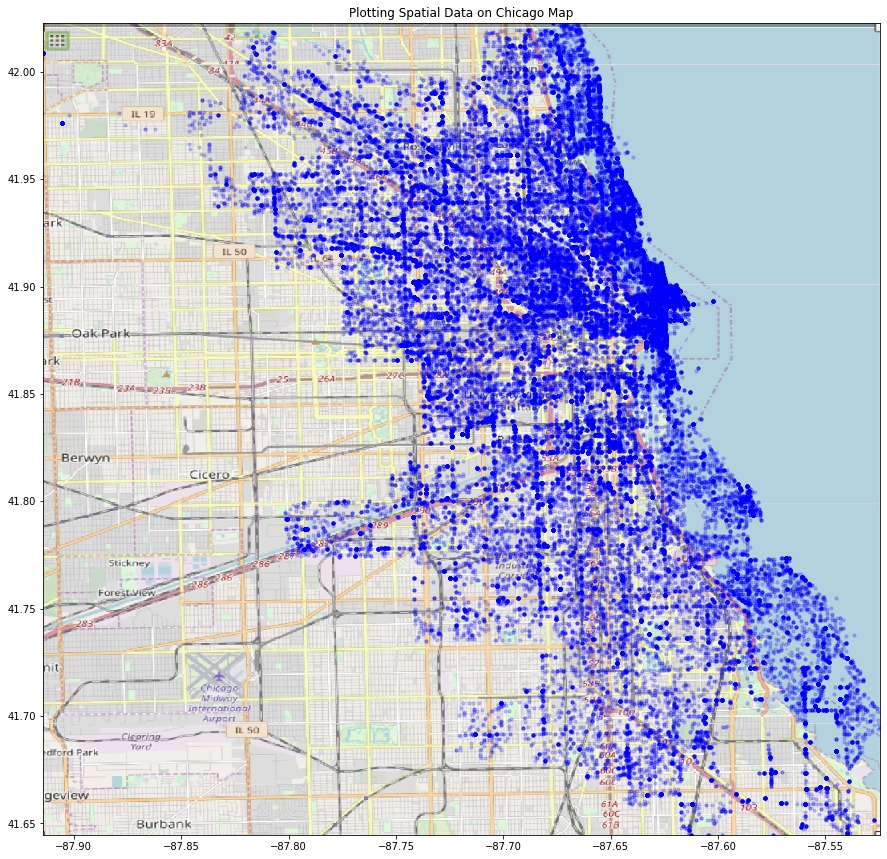

In [23]:
ruh_m = plt.imread('./chi3.png')


fig, ax = plt.subplots(figsize = (15,15))
ax.scatter(df_t.longitude_x, df_t.latitude_x, zorder=1, alpha= 0.2, c='b', s=10)
ax.set_title('Plotting Spatial Data on Chicago Map')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])

ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal')


### OK THAT WAS A WASTE OF TIME, openstreetview isnt good for large areas. Well I didnt seem to get it to work well so i screenshot a rough version and it really is not percise ...... next we will try plot.ly

## Plot.ly 

In [24]:
import plotly.express as px


In [25]:
px.set_mapbox_access_token(open("./.mapbox_token").read())


In [28]:
fig = px.scatter_mapbox(df_t, lat="latitude_x", lon="longitude_x",     
                        color="enforcement", 
                        color_discrete_map=px.colors.cyclical.IceFire_r)
fig.update_layout(
    autosize=False,
    width=900,
    height=900)
fig.show()
